## U-Net for Human Vascular Cell Segmentation (Kaggle)

In [25]:
import tensorflow as tf
import numpy as np

from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
import os
import pandas as pd
from PIL import Image
import imageio
import cv2
import matplotlib.pyplot as plt
import shutil
from tensorflow.keras.applications.efficientnet import preprocess_input


In [102]:

path = 'hubmap-hacking-the-human-vasculature'
train_image_path = os.path.join(path, 'train/')
train_image_list_orig = os.listdir(train_image_path)
train_image_list = [train_image_path + i for i in train_image_list_orig]

print(train_image_list[200])


hubmap-hacking-the-human-vasculature/train/f82f25edda5a.tif


In [27]:
test_image_path = os.path.join(path, 'test/')
test_image_list_orig = os.listdir(test_image_path)
test_image_list = [test_image_path + i for i in test_image_list_orig]

print(test_image_list[0])

hubmap-hacking-the-human-vasculature/test/72e40acccadf.tif


In [28]:
# Read tile_meta.csv to get image ids for Datasets
tile_meta = pd.read_csv(os.path.join(path,'tile_meta.csv'))
dataset1_ids = tile_meta[tile_meta['dataset']==1]['id'].values
dataset2_ids = tile_meta[tile_meta['dataset']==2]['id'].values
dataset3_ids = tile_meta[tile_meta['dataset']==3]['id'].values
print(len(dataset1_ids))
print(len(dataset2_ids))
print(len(dataset3_ids))

422
1211
5400


In [29]:
# Get all images belonging to dataset1
dataset1_image_list = []
for i in dataset1_ids:
    dataset1_image_list.append(train_image_path + i + '.tif')
print(len(dataset1_image_list))


422


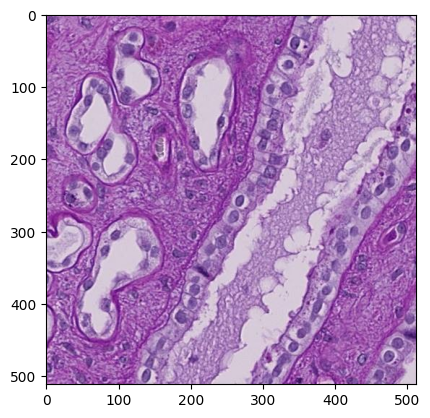

In [30]:
# Show an image from dataset1
image = Image.open(dataset1_image_list[0])
plt.imshow(image)
plt.show()


In [31]:
# Get all images belonging to dataset2
dataset2_image_list = []
for i in dataset2_ids:
    dataset2_image_list.append(train_image_path + i + '.tif')
print(len(dataset2_image_list))

1211


In [32]:
# Get all images belonging to dataset3
dataset3_image_list = []
for i in dataset3_ids:
    dataset3_image_list.append(train_image_path + i + '.tif')
print(len(dataset3_image_list))


5400


In [33]:

def create_mask(height, width, annotation_dict):
    # Initialize an empty mask
    mask = np.zeros((height, width), dtype=np.uint8)

    # Define a label for each class: blood_vessel is 1, glomerulus is 2, unsure is 3, other is 0 (background)
    label_dict = {'blood_vessel': 1, 'glomerulus': 2, 'unsure': 3}

    # Go through each annotation in the dictionary
    for annotation in annotation_dict:
        structure_type = annotation['type']
        coordinates_list = annotation['coordinates']

        # Assign the label for each class
        mask_label = label_dict.get(structure_type, 0)  # if the structure_type is not in label_dict, treat it as 'other'

        for coordinates in coordinates_list:
            # Convert the coordinates to a numpy array and reshape to meet fillPoly requirements
            pts = np.array(coordinates, np.int32)
            pts = pts.reshape((-1, 1, 2))

            # Draw the polygon on the mask
            cv2.fillPoly(mask, [pts], mask_label)

    # Return the resulting mask
    return mask

In [34]:
# Load JSON file
import json

data = []
with open('hubmap-hacking-the-human-vasculature/polygons.jsonl', 'r') as file:
    for line in file:
        data.append(json.loads(line))

In [14]:
annotations_dict = {item['id']: item['annotations']  for item in data}

In [15]:
# Get all dataset1 annotations
dataset1_annotations = []
for id in dataset1_ids:
    dataset1_annotations.append(annotations_dict[id])
print(len(dataset1_annotations))

422


In [16]:
print(dataset1_annotations[1])

[{'type': 'blood_vessel', 'coordinates': [[[511, 426], [511, 426], [510, 426], [510, 425], [509, 425], [509, 424], [508, 424], [508, 423], [507, 423], [507, 422], [506, 422], [506, 421], [505, 421], [505, 420], [505, 419], [504, 419], [504, 418], [504, 417], [504, 416], [504, 415], [503, 415], [503, 414], [503, 413], [503, 412], [503, 411], [503, 410], [504, 409], [504, 409], [504, 408], [505, 407], [505, 407], [505, 406], [506, 405], [506, 405], [507, 404], [507, 404], [508, 403], [508, 403], [509, 402], [509, 402], [510, 401], [511, 401], [511, 401], [511, 400], [511, 401], [511, 402], [511, 403], [511, 404], [511, 405], [511, 406], [511, 407], [511, 408], [511, 409], [511, 410], [511, 411], [511, 412], [511, 413], [511, 414], [511, 415], [511, 416], [511, 417], [511, 418], [511, 419], [511, 420], [511, 421], [511, 422], [511, 423], [511, 424], [511, 425], [511, 426], [511, 426]]]}, {'type': 'blood_vessel', 'coordinates': [[[157, 404], [156, 404], [155, 404], [154, 404], [153, 404], 

In [17]:
# Get all dataset2 annotations
dataset2_annotations = []
for id in dataset2_ids:
    dataset2_annotations.append(annotations_dict[id])
print(len(dataset2_annotations))

1211


In [18]:
train_dataset1 = pd.DataFrame({'image': dataset1_image_list, 'mask': dataset1_annotations})
train_dataset2 = pd.DataFrame({'image': dataset2_image_list, 'mask': dataset2_annotations})

# Combine dataset1 and dataset2
combined_dataset = pd.concat([train_dataset1, train_dataset2], ignore_index=True)
# Shuffle the dataframe
combined_dataset = combined_dataset.sample(frac=1, random_state=42)
# Reset the index of the shuffled dataframe
combined_dataset.reset_index(drop=True, inplace=True)
print(len(combined_dataset))

1633


In [19]:
classes = ('blood_vessel', 'unsure', 'glomerulus')

/var/folders/33/x99lf2957qnbskhfrkjg00dc0000gn/T/ipykernel_94781/852035554.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(combined_dataset['image'][i])


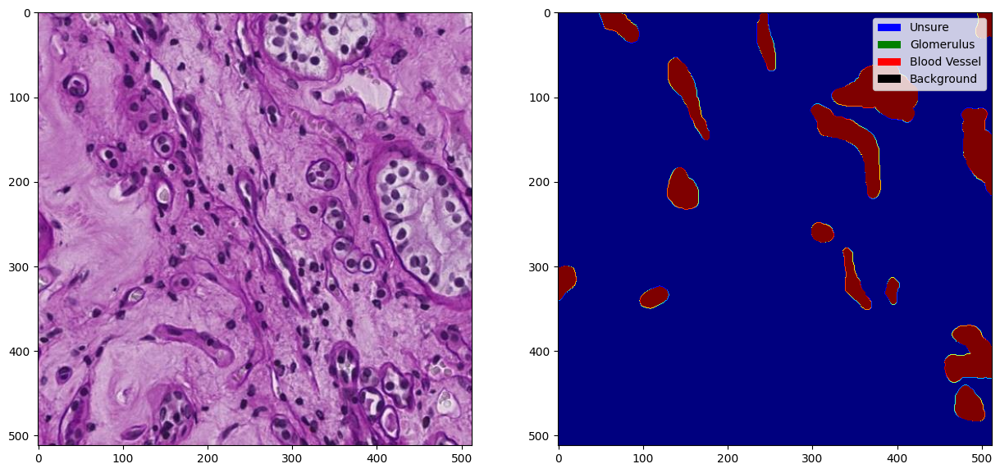

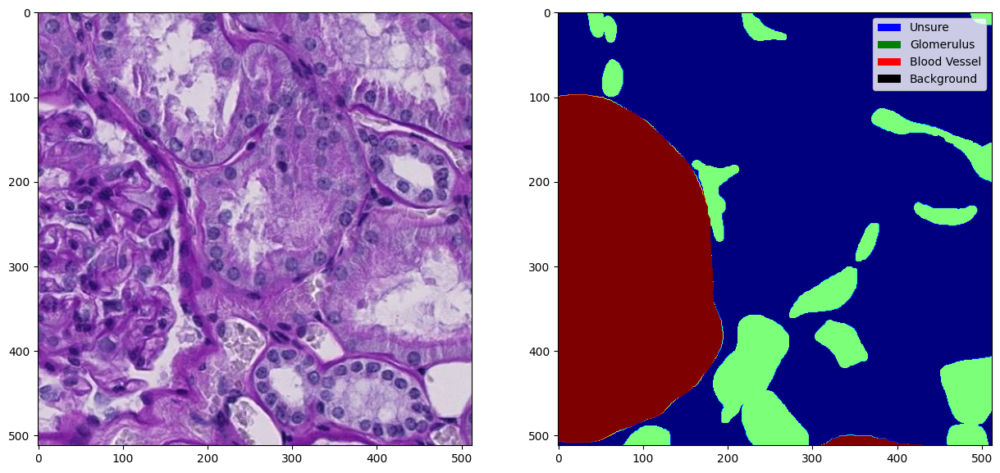

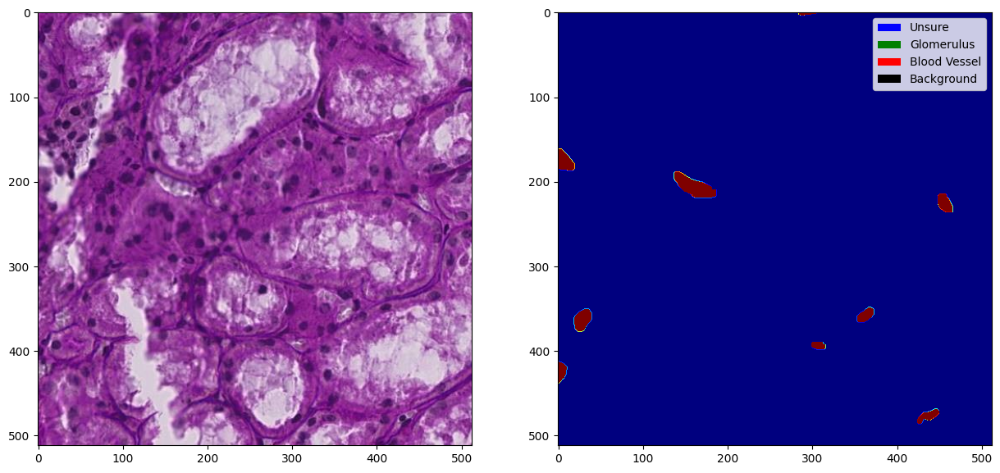

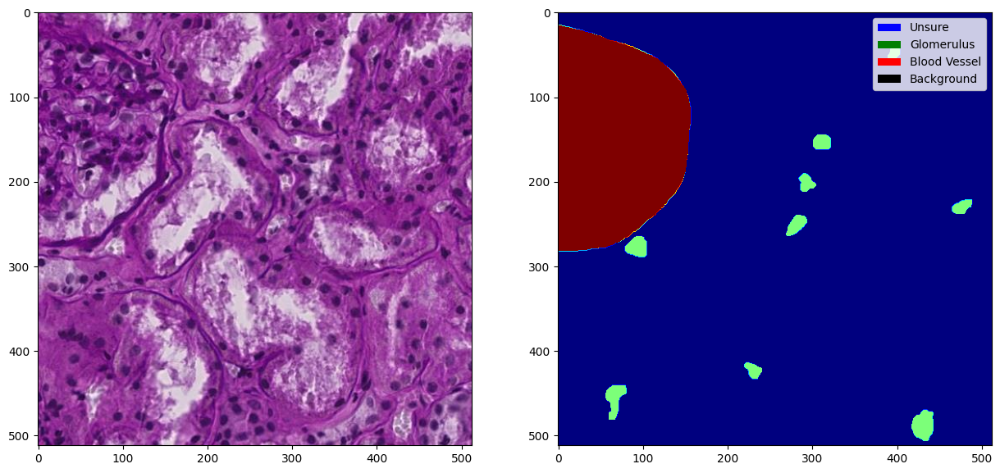

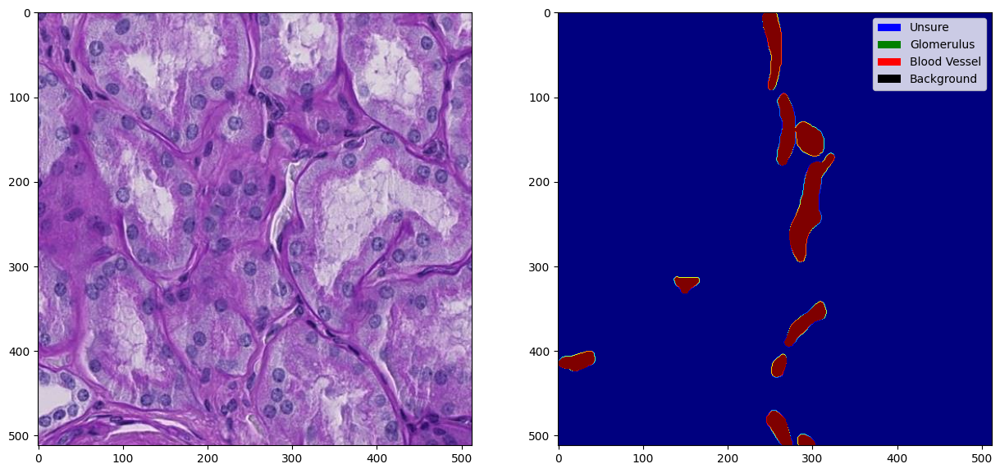

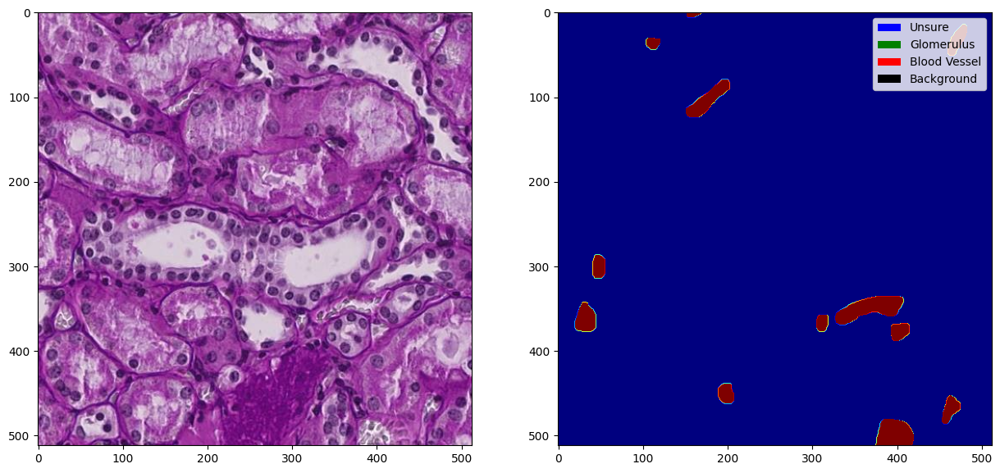

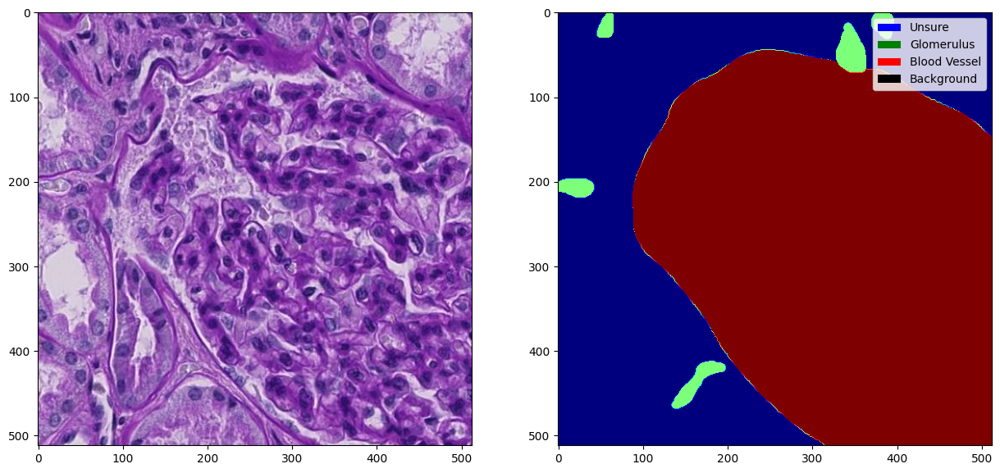

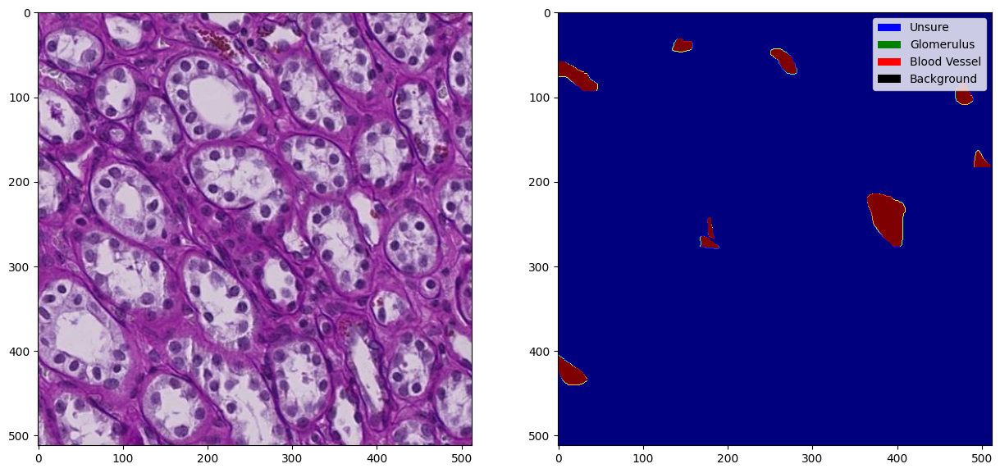

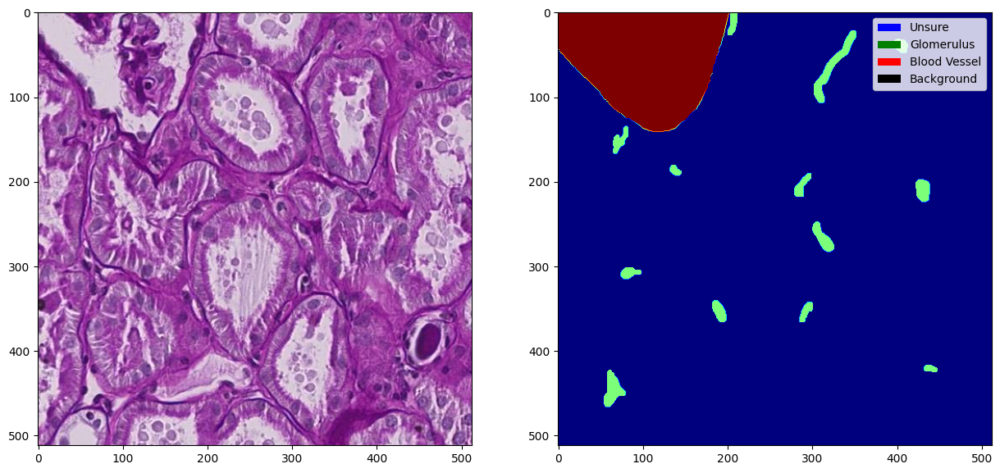

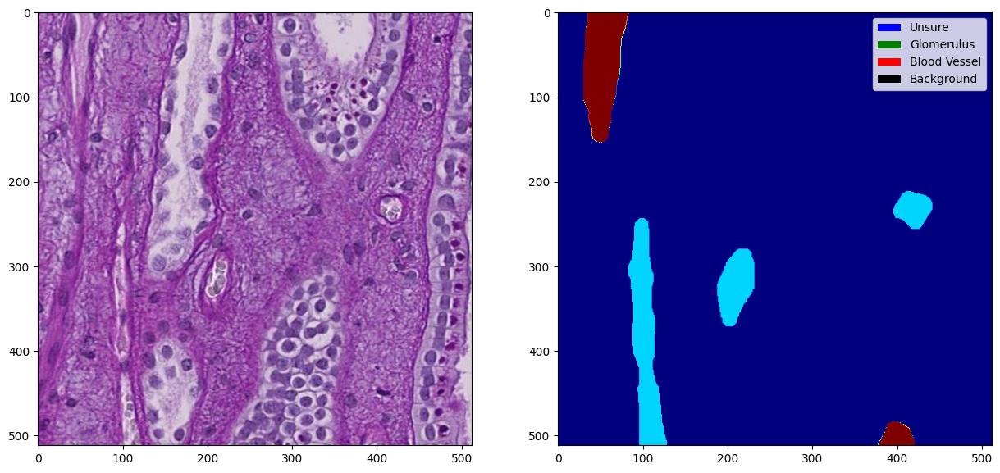

In [20]:
from matplotlib.patches import Patch

num_samples = 10
for i in range(num_samples):

    # Get image and mask
    image = imageio.imread(combined_dataset['image'][i])
    mask = create_mask(image.shape[0], image.shape[1], combined_dataset['mask'][i])

    # Define the legend elements
    legend_elements = [Patch(facecolor='blue', label='Unsure'),
                    Patch(facecolor='green', label='Glomerulus'),
                    Patch(facecolor='red', label='Blood Vessel'),
                    Patch(facecolor='black', label='Background')]

    # Plot image and mask
    fig, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(image)
    ax[1].imshow(image, cmap='gray')
    ax[1].imshow(mask, alpha=1, cmap='jet')
    # Add the legend to the plot
    ax[1].legend(handles=legend_elements, loc='upper right')

    plt.show()


In [21]:
# Create directory for masks and train images
masks_dir_path = os.path.join(path, 'train_masks')
images_dir_path = os.path.join(path, 'train_images')
os.makedirs(masks_dir_path, exist_ok=True)
os.makedirs(images_dir_path, exist_ok=True)

if os.listdir(masks_dir_path):
    shutil.rmtree(masks_dir_path)
    os.makedirs(masks_dir_path, exist_ok=True)

if os.listdir(images_dir_path):
    shutil.rmtree(images_dir_path)
    os.makedirs(images_dir_path, exist_ok=True)

for i in range(len(combined_dataset)):
    # Copy image
    image = cv2.imread(combined_dataset['image'][i])
    image_path = os.path.join(images_dir_path, f'image{i}.png')
    cv2.imwrite(image_path, image)

    # Create mask
    mask = create_mask(image.shape[0], image.shape[1], combined_dataset['mask'][i])
    mask_path = os.path.join(masks_dir_path, f'image{i}.png')
    cv2.imwrite(mask_path, mask)



# Data Loading from Folders

In [103]:
train_image_path = os.path.join(path, 'train_images')
train_mask_path = os.path.join(path, 'train_masks')

# Get all image and mask paths
train_image_list_orig = os.listdir(train_image_path)
train_image_list = [train_image_path + '/' + i for i in train_image_list_orig]
train_mask_list = [train_mask_path + '/' + i for i in train_image_list_orig]

In [104]:
print(len(train_image_list))
print(len(train_mask_list))

1633
1633


In [105]:
image = imageio.imread(train_image_list[0])
print(image.shape)

(512, 512, 3)


/var/folders/33/x99lf2957qnbskhfrkjg00dc0000gn/T/ipykernel_67820/2768188873.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(train_image_list[0])


In [106]:
# Split Datasets
image_list_ds = tf.data.Dataset.list_files(train_image_list, shuffle=False)
mask_list_ds = tf.data.Dataset.list_files(train_mask_list, shuffle=False)

for path in zip(image_list_ds.take(3), mask_list_ds.take(3)):
    print(path)


(<tf.Tensor: shape=(), dtype=string, numpy=b'hubmap-hacking-the-human-vasculature/train_images/image0.png'>, <tf.Tensor: shape=(), dtype=string, numpy=b'hubmap-hacking-the-human-vasculature/train_masks/image0.png'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'hubmap-hacking-the-human-vasculature/train_images/image1.png'>, <tf.Tensor: shape=(), dtype=string, numpy=b'hubmap-hacking-the-human-vasculature/train_masks/image1.png'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'hubmap-hacking-the-human-vasculature/train_images/image10.png'>, <tf.Tensor: shape=(), dtype=string, numpy=b'hubmap-hacking-the-human-vasculature/train_masks/image10.png'>)


In [107]:
image_filenames = tf.constant(train_image_list)
masks_filenames = tf.constant(train_mask_list)

dataset = tf.data.Dataset.from_tensor_slices((image_filenames, masks_filenames))

for image, mask in dataset.take(1):
    print(image)
    print(mask)

tf.Tensor(b'hubmap-hacking-the-human-vasculature/train_images/image861.png', shape=(), dtype=string)
tf.Tensor(b'hubmap-hacking-the-human-vasculature/train_masks/image861.png', shape=(), dtype=string)


# Preprocess Data

In [109]:
def process_path(image_path, mask_path):
    num_classes = 1
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.squeeze(mask, axis=-1)  # remove the last dimension
    #mask = tf.one_hot(mask, depth=num_classes)  # one-hot encoding

    # Convert mask to binary
    mask = tf.where(mask == 1, 1, 0)
    mask = tf.expand_dims(mask, axis=-1)  # add the last dimension back

    mask = tf.cast(mask, tf.float32)  # cast to float32 if needed

    return img, mask

# def preprocess(image, mask):
#     input_image = tf.image.resize(image, (96, 128), method='nearest')
#     input_mask = tf.image.resize(mask, (96, 128), method='nearest')

#     return input_image, input_mask

image_ds = dataset.map(process_path)
# processed_image_ds = image_ds.map(preprocess)


In [110]:
for image, mask in image_ds.take(1):
    print(image.shape)
    print(mask.shape)

(512, 512, 3)
(512, 512, 1)


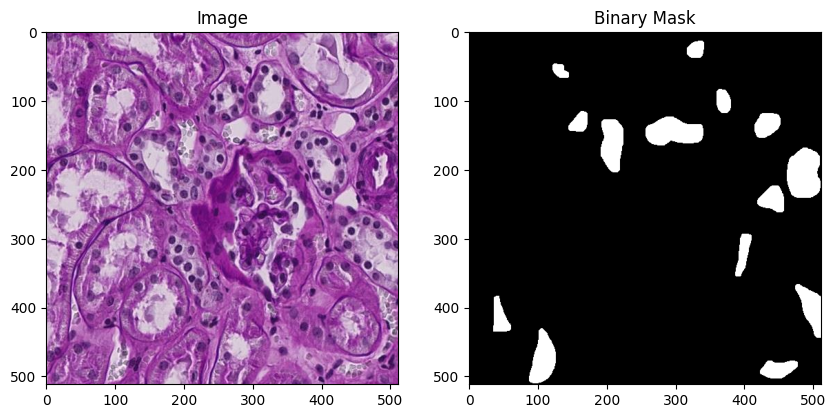

In [111]:
# Make one batch from the dataset
for img, mask in image_ds.batch(1).take(1):
    # Only take one sample from the batch
    img = img[0]
    mask = mask[0]
    
    # Display the image and mask
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Image")
    
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')  # display the first (and only) channel of the mask
    plt.title('Binary Mask')

plt.show()

# U-NET 

In [112]:
def conv_block(inputs=None, n_filters=64, dropout_prob=0, max_pooling=True):
    
    conv = Conv2D(filters=n_filters, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv = Conv2D(filters=n_filters, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(conv)

    if dropout_prob > 0:
        conv = Dropout(dropout_prob)(conv)

    if max_pooling:
        next_layer = MaxPooling2D(pool_size=2)(conv)

    else:
        next_layer = conv
    
    skip_connection = conv

    return next_layer, skip_connection


In [113]:
def upsampling_block(expansive_input, contractive_input, n_filters=64):

    up = Conv2DTranspose(filters=n_filters, kernel_size=3, strides=2, padding='same')(expansive_input)
    merge = concatenate([up, contractive_input], axis=3)
    conv = Conv2D(filters=n_filters, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(merge)
    conv = Conv2D(filters=n_filters, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(conv)
    

    return conv

In [114]:
def unet_model(input_size=(512, 512, 3), n_filters=64, n_classes=1):

    inputs = Input(input_size)
    
    cblock1 = conv_block(inputs, n_filters=n_filters)
    cblock2 = conv_block(cblock1[0], n_filters=n_filters*2)
    cblock3 = conv_block(cblock2[0], n_filters=n_filters*4)
    cblock4 = conv_block(cblock3[0], n_filters=n_filters*8, dropout_prob=0.3)
    cblock5 = conv_block(cblock4[0], n_filters=n_filters*16, dropout_prob=0.3, max_pooling=False)

    ublock6 = upsampling_block(cblock5[0], cblock4[1], n_filters=n_filters*8)
    ublock7 = upsampling_block(ublock6, cblock3[1], n_filters=n_filters*4)
    ublock8 = upsampling_block(ublock7, cblock2[1], n_filters=n_filters*2)
    ublock9 = upsampling_block(ublock8, cblock1[1], n_filters=n_filters)

    conv9 = Conv2D(filters=n_filters, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(ublock9)
    conv10 = Conv2D(filters=n_classes, kernel_size=1, activation='sigmoid', padding='same')(conv9)

    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

In [115]:
unet = unet_model(input_size=(512, 512, 3), n_filters=64, n_classes=2)



In [116]:
unet.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d_40 (Conv2D)          (None, 512, 512, 64)         1792      ['input_3[0][0]']             
                                                                                                  
 conv2d_41 (Conv2D)          (None, 512, 512, 64)         36928     ['conv2d_40[0][0]']           
                                                                                                  
 max_pooling2d_8 (MaxPoolin  (None, 256, 256, 64)         0         ['conv2d_41[0][0]']           
 g2D)                                                                                       

In [93]:
# Class weights
# Define class weights
class_weights = tf.constant([1.0, 30.0, 25.0, 25.0])

def weighted_cross_entropy(y_true, y_pred):
    # Calculate the categorical crossentropy
    cce = tf.keras.losses.categorical_crossentropy(y_true, y_pred, from_logits=False)
    # Apply the weights
    weight_vector = y_true * class_weights
    weighted_cce = tf.reduce_sum(weight_vector, axis=-1) * cce
    return tf.reduce_mean(weighted_cce)




In [117]:
from keras import backend as K
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean((2. * intersection + smooth)/(union + smooth), axis=0)



In [118]:
# Loss function
# loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

# unet.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
unet.compile(optimizer='adam', loss = 'binary_crossentropy', metrics=[dice_coef])

In [119]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()
    

(512, 512, 1)
(512, 512, 3)


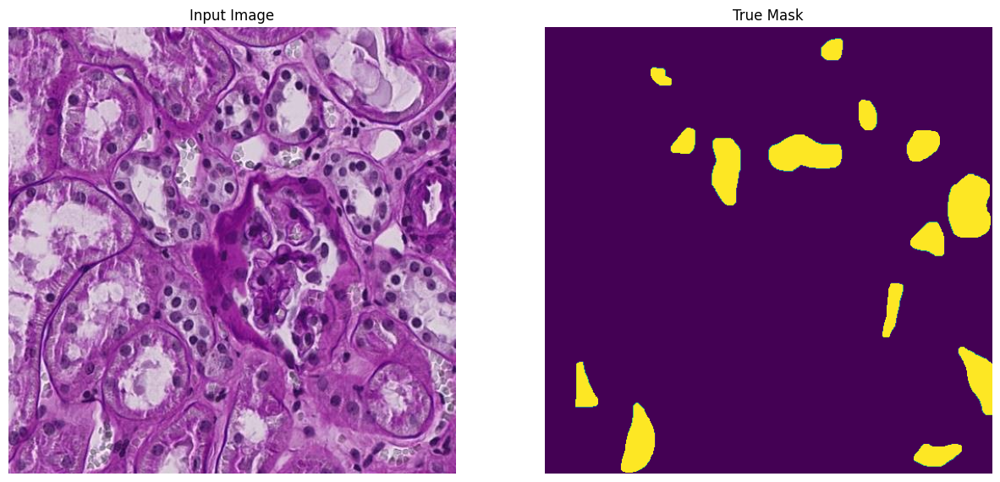

In [120]:
for image, mask in image_ds.take(1):
    sample_image, sample_mask = image, mask
    print(mask.shape)
    print(image.shape)
display([sample_image, sample_mask])

# Train Model

In [121]:
EPOCHS=3
VAL_SUBSPLITS = 5
BUFFER_SIZE = 2000
BATCH_SIZE = 32

# Define your directory
directory = './cache_data'

# Remove the cache data folder if it already exists
if os.path.exists(directory):
    shutil.rmtree(directory)

# Make sure the directory exists
os.makedirs(directory)

num_images = len(image_ds)  # get the number of elements in the dataset
train_split = 0.9
num_train = int(num_images * train_split)

# Split the dataset
train_ds = image_ds.take(num_train)
test_ds = image_ds.skip(num_train)

# Apply caching, shuffling, and batching
cache_filepath = os.path.join(directory, 'cache_file')
train_dataset = train_ds.cache(cache_filepath).shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

@tf.function
def transform_images_masks(images, masks):
    # Data augmentation code goes here
    images = tf.image.random_flip_left_right(images)
    images = tf.image.random_flip_up_down(images)
    masks = tf.image.random_flip_left_right(masks)
    masks = tf.image.random_flip_up_down(masks)

    # Rotate
    rotate = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    images = tf.image.rot90(images, rotate)
    masks = tf.image.rot90(masks, rotate)

    # Brightness and contrast
    images = tf.image.random_brightness(images, max_delta=0.5)
    images = tf.image.random_contrast(images, lower=0.5, upper=1.5)

    return images, masks

# Apply the Data Augmentations to the training dataset
# train_dataset = train_dataset.map(transform_images_masks, num_parallel_calls=tf.data.AUTOTUNE)

# Prepare test dataset
test_dataset = test_ds.batch(BATCH_SIZE)

# Define the callback to save the best model based on validation loss
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='./models/best_model.h5',
    monitor='val_dice_coef',  # Change the monitor to validation accuracy
    save_best_only=True,
    save_weights_only=False,
    mode='max',  # Set the mode to 'max' since we want to maximize the validation accuracy
    verbose=0
)

# Fit the model
print(image_ds.element_spec)
model_history = unet.fit(train_dataset, epochs=EPOCHS, validation_data=test_dataset, callbacks=[checkpoint_callback])

(TensorSpec(shape=(None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, 1), dtype=tf.float32, name=None))
Epoch 1/3


2023-07-26 00:53:28.454017: W tensorflow/core/kernels/data/cache_dataset_ops.cc:298] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


46/46 [==============================] - ETA: 0s - loss: 0.2786 - dice_coef: 0.0360  

/Users/idane/opt/anaconda3/envs/LandmarkDetection/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


46/46 [==============================] - 16017s 342s/step - loss: 0.2786 - dice_coef: 0.0360 - val_loss: 0.2027 - val_dice_coef: 0.0361
Epoch 2/3
46/46 [==============================] - 13973s 304s/step - loss: 0.1823 - dice_coef: 0.0395 - val_loss: 0.1976 - val_dice_coef: 0.0402
Epoch 3/3
46/46 [==============================] - 15967s 349s/step - loss: 0.1801 - dice_coef: 0.0409 - val_loss: 0.1952 - val_dice_coef: 0.0477


# Load Model and Perform Prediction Task

In [122]:
# Load model
custom_objects = {'dice_coef': dice_coef}
load_model = tf.keras.models.load_model('./models/best_model.h5', custom_objects=custom_objects)


In [123]:
# Continue to train the model
additional_epochs = 3
model_history_2 = load_model.fit(train_dataset, 
                           epochs=additional_epochs, 
                           validation_data=test_dataset, 
                           callbacks=[checkpoint_callback])  # you can use the same callback

Epoch 1/3


46/46 [==============================] - 21566s 470s/step - loss: 0.1783 - dice_coef: 0.0448 - val_loss: 0.1953 - val_dice_coef: 0.0423
Epoch 2/3
46/46 [==============================] - 21397s 465s/step - loss: 0.1777 - dice_coef: 0.0470 - val_loss: 0.1940 - val_dice_coef: 0.0557
Epoch 3/3
32/46 [===================>..........] - ETA: 1:44:03 - loss: 0.1790 - dice_coef: 0.0450

In [17]:
# Test image path
test_set_path = os.path.join(path, 'train')
# Get the list of all images in the test directory
test_images = os.listdir(test_set_path)
# Get test image path
test_image_path = os.path.join(test_set_path, test_images[0])
print(test_image_path)

# Read the image
test_image = cv2.imread(test_image_path)
# Check image shape
print(test_image.shape)
# Save image as png
cv2.imwrite('./test_image.png', test_image)






hubmap-hacking-the-human-vasculature/train/0b7772cced70.tif
(512, 512, 3)


True

In [18]:
test_path = './test_image.png'

# Preprocess the image
def decode_test(path):
    test_img = tf.io.read_file(path)
    test_img = tf.image.decode_png(test_img, channels=3)
    test_img = tf.image.convert_image_dtype(test_img, tf.float32)
    return test_img

test_input = decode_test(test_path)

In [19]:
# Use model to predict mask
test_input = tf.expand_dims(test_input, axis=0)
pred_mask = load_model.predict(test_input)

# Threshold the predicted mask
threshold = 0.5
pred_mask = tf.where(pred_mask > threshold, 1, 0)
pred_mask = tf.squeeze(pred_mask)

print(pred_mask.shape)


1/1 [==============================] - 2s 2s/step
(512, 512)
